##GG3209 Lab Assignment 2 - Python
230018899


## Part 1 - Basics

**1.2**

In [ ]:
def average (a,b,c,d,e):
    return (a+b+c+d+e)/5

list1=average(1,12,25,39,47)
print(list1)

24.8


**1.3**

The first two expressions import the pandas and geopandas libraries for use in the program, and assign them to pd and gpd for ease of use in the script.

**1.4**

I simply removed the unneccessary indentation before the second line. The code now runs as expected and the output is 'My name is Dave and I own 0 dogs.'

**1.5**

In [ ]:
a = 10
b = "Weeks"
c = str(a) +" "+ b
print (c)

**1.6**

In [ ]:
daysToExam = 10
haveClass = True

if daysToExam > 0:

    if haveClass == True:
        print("Better get to class!")

    else:
        print ("Time to study")

elif daysToExam == 0:

    if haveClass == True:
        print("You have an exam, skip your class!")

    else:
        print("Good luck with the exam!")

elif daysToExam <0:
    print("You missed your exam!")

**1.7**

In [ ]:
def mileToKM(miles):
    return miles * 1.6

x = mileToKM (24)
print(x)

**1.8**

In [ ]:
def multTable (x):
    return x,x*2,x*3,x,4,x*5,x*6,x*7,x*8,x*9,x*10

Output = multTable(10)
print(Output)

**1.9**

**1.10**

In [ ]:
import numpy as np
import pandas as pd

earthquakes = pd.read_csv('/arcgis/home/Latest_earthquake_world.csv', sep=",", header=0, encoding="ISO-8859-1")
earthquakes.head(30)

**Final Challenge**

Create a new 'Mpop' column:

In [ ]:
cities['Mpop'] = cities['pop'] / 1_000_000

Remove old 'pop' column:

In [ ]:
cities = cities.drop(columns='pop')

Subset a city beginning with the first letter of my name (C):

In [ ]:
chicago = cities[cities['city'] == 'Chicago']

Display 5 largest cities from country of my city:

In [ ]:
top5 = cities[cities['country'] == cities.loc[cities['city'] == 'Chicago', 'country'].iloc[0]].nlargest(5, 'Mpop')
print (top5)

# Part 2 - Numpy and Pandas

## Numpy

**2.0**

In [ ]:
import numpy as np

**2.1**

In [ ]:
#Array of 10 ones
arr1=np.ones(10)

#Array of 1-20
arr2= np.arange(1,21,1)

#5x5 matrix
arr3 = np.ones((2, 5, 5), dtype="int")

**2.2**

In [ ]:
arr4=np.random.randn(3,3,3)
arr4=arr4.reshape(27)

**2.3**

In [ ]:
arr5=np.linspace(1,10,20)

**2.4**

In [ ]:
#2.4.1
print (a[3,4])

# 2.4.2
print(a[1:5,3:5])

# 2.4.3
print(a[1,:])

**2.5**

In [ ]:
print(np.sum(a))

**2.6**

In [ ]:
print(a.sum(axis=1))

**2.7**

In [ ]:
print(a[a>np.mean(a)])

## Pandas

**2.8**

In [ ]:
import pandas as pd

**2.9**

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-02-18/food_consumption.csv',header=0, encoding="ISO-8859-1")


**2.10**

In [ ]:
print(len(df))
#Answer: 1430

**2.11**

In [ ]:
mean = df["co2_emmission"].mean()
print(mean)

#Answer: 74.383993006993

**2.12**

In [ ]:
max = df["co2_emmission"].max()
print(max)

#Answer: 1712.0

**2.13**

In [ ]:
high_Emit = df[df["co2_emmission"] > 1000]
high_Emit_Country = high_Emit["country"].count()
print(high_Emit_Country)

#Answer: 5

**2.14**

In [ ]:
beef_only = df[df["food_category"] == "Beef"]
min_consumption = beef_only["consumption"].min()

least_Beef = df[(df["food_category"] == "Beef") & (df["consumption"] == min_consumption)]

print(least_Beef[["country", "consumption"]])

#Answer: Liberia

**2.15**

In [ ]:
meat = df.query('food_category=="Beef" or food_category=="Pork" or food_category == "Poultry" or food_category == "Fish" or food_category == "Lamb & Goat"')

meat_Emit = meat["co2_emmission"].sum()

print(meat_Emit)

#Answer: 74441.13

**2.16**

In [ ]:
tot_emit = df["co2_emmission"].sum()

non_meat_emit = tot_emit - meat_Emit

print(non_meat_emit)

#Answer: 31927.97999999998

# Part 3 - Geo Pandas and Rasterio

## Geo Pandas

**Reading London Census data to GeoDataFrame**

In [ ]:
# Define the folder containing the zip files
folder_with_zips = '/content/drive/MyDrive/Colab Notebooks/data/'

# Ensure the output directory exists
output_dir = '/content/drive/MyDrive/Colab Notebooks/data/'
os.makedirs(output_dir, exist_ok=True)

# Iterate through the files in the folder
for filename in os.listdir(folder_with_zips):
    file_path = os.path.join(folder_with_zips, filename)

    # Check if the file is a zip file
    if filename.endswith('.zip'):
        with zipfile.ZipFile(file_path, 'r') as zip_ref:
            # Create a folder with the same name as the zip file (without the .zip extension), that is very convenient.
            folder_name = os.path.splitext(filename)[0]
            folder_path = os.path.join(output_dir, folder_name)
            os.makedirs(folder_path, exist_ok=True)

            # Extract the contents of the zip file into the folder
            zip_ref.extractall(folder_path)

            print(f'Oh look what I got, Unzipped {filename} to {folder_path}')
    else:
        print(f'Skipping {filename} (Sorry, not a zip file)')

#Read the file to a GeoDataFrame
census_geo = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/data/london_data/london_data/Census20_LSOA.shp')

**Subsetting the dataset**

In [ ]:

census_subset = census_geo [["LSOA11CD",	"LSOA11NM",	"LSOA11NMW", "Pop20"]]

**Getting the CRS of the data**

In [ ]:
census_geo.crs

The CRS used by the data is British National Grid.

**How many features does the layer contain?**

In [ ]:
print(len(census_geo))

3920

**Ensuring values in the LSOA11CD column are unique**

In [ ]:
duplicate_rows = census_geo[census_geo.duplicated()]
print(duplicate_rows)

This returns a blank dataframe (i.e. there are no duplicates).

**Plotting the layer using .plot**

In [ ]:
census_geo.plot()

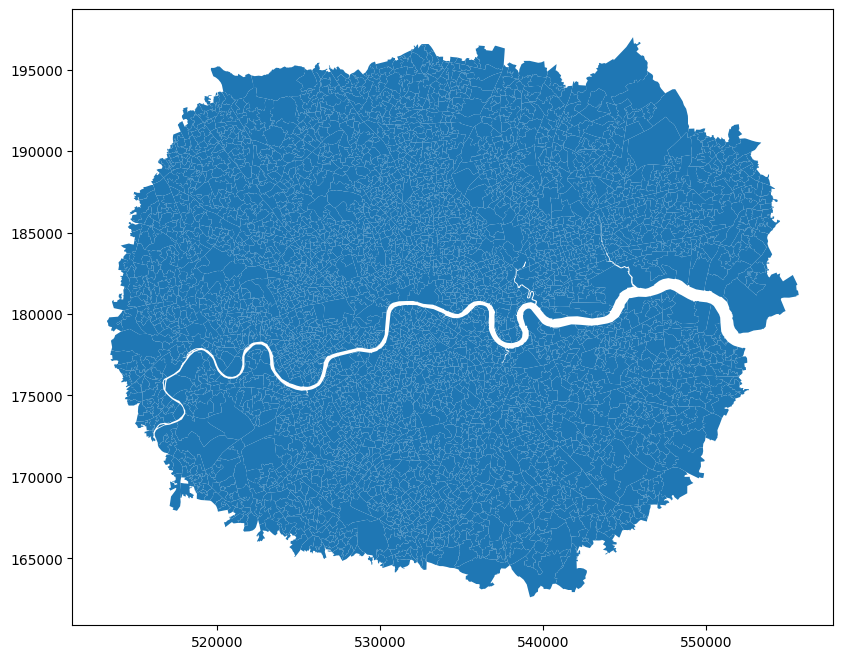

**Plotting the layer using .explore**

In [ ]:
census_geo.explore()

**Subsetting for areas with more than 1500 people**

In [ ]:
high_pop = census_geo['Pop20']>1500
high_pop_df = census_geo[high_pop]
high_pop_df

**Creating a colour coded map of high population areas**

<Axes: >

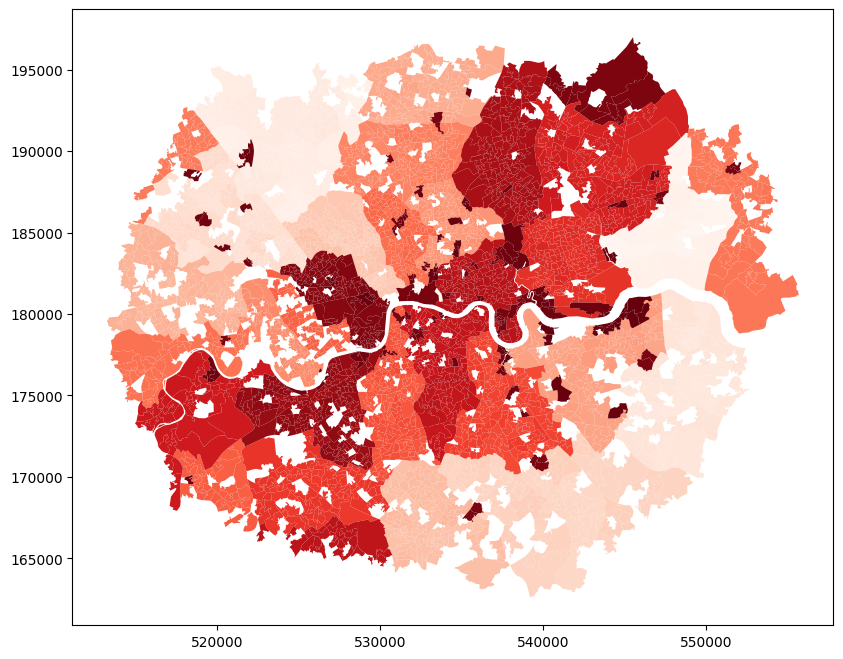

In [ ]:
high_pop_df.plot(cmap="Reds")


**How many areas with a population over 1500 people?**

In [ ]:
print(len(high_pop_df))

#Answer: 3361

**Total population of high population areas**

In [ ]:
total_pop = high_pop_df['Pop20'].sum()
print (total_pop)

#Answer: 6587889.0

## Rasterio

**Read the file as a raster data set**

In [ ]:
rast1 = rio.open('/content/drive/MyDrive/Colab Notebooks/data/Clipped_Raster_Nov25/Clipped_Raster.tif')

**What is the CRS of the dataset?**

In [ ]:
print(rast1.crs)

The CRS is EPSG:32610, otherwise known as World Geodetic System 1984 (WGS1984)

**What is the raster extent of the dataset?**

In [ ]:
print(rast1.bounds)

BoundingBox(left=532627.5, bottom=5221222.5, right=639232.5, top=5289412.5)

**How many bands are in the dataset?**

In [ ]:
rio.open('/content/drive/MyDrive/Colab Notebooks/data/Clipped_Raster_Nov25/Clipped_Raster.tif').count

#Answer: 1

This is a single band raster

**Create a plot of the image**

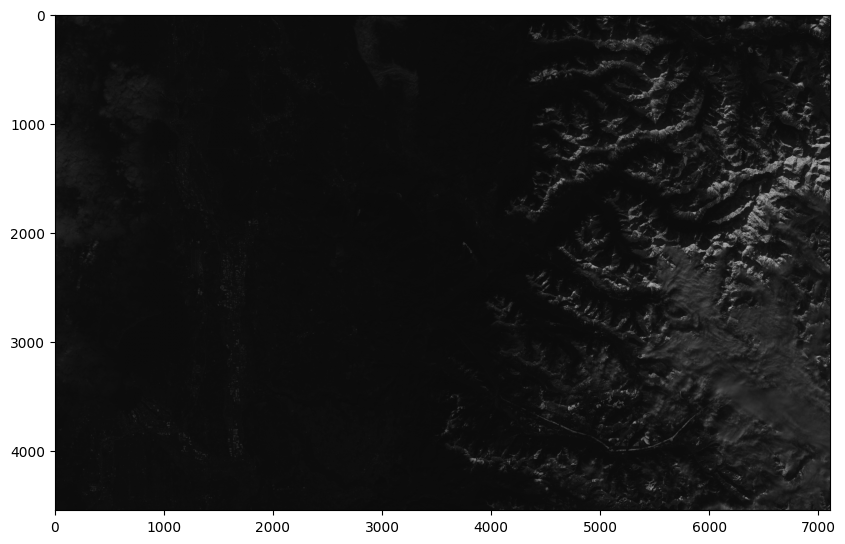

In [ ]:
rast_arr = rast1.read()
image_read_masked = np.ma.masked_array(rast_arr[0], mask=(rast_arr[0] == 0))

plt.imshow(image_read_masked, cmap="gist_gray")

**Create a histogram of the raster**

(<Figure size 1200x1200 with 1 Axes>, <Axes: >)

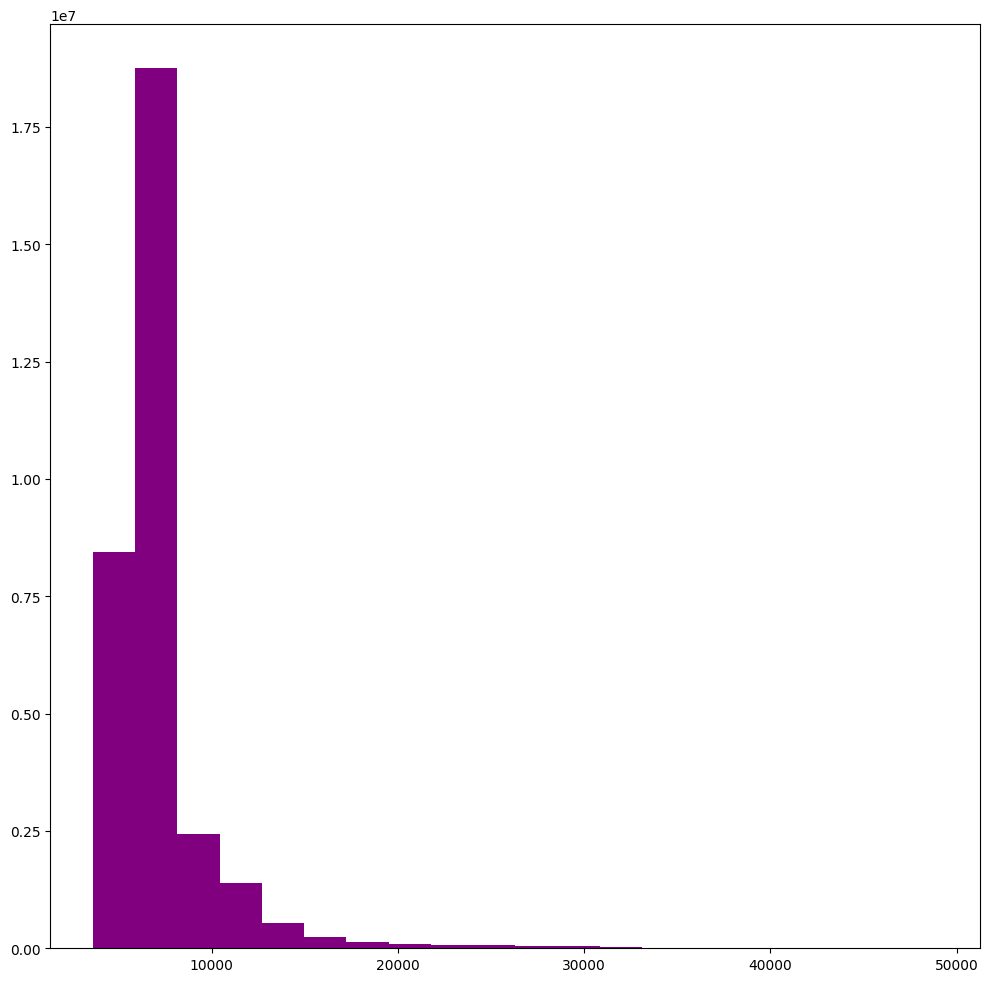

In [ ]:
ep.hist(rast_arr)

**False colour map**

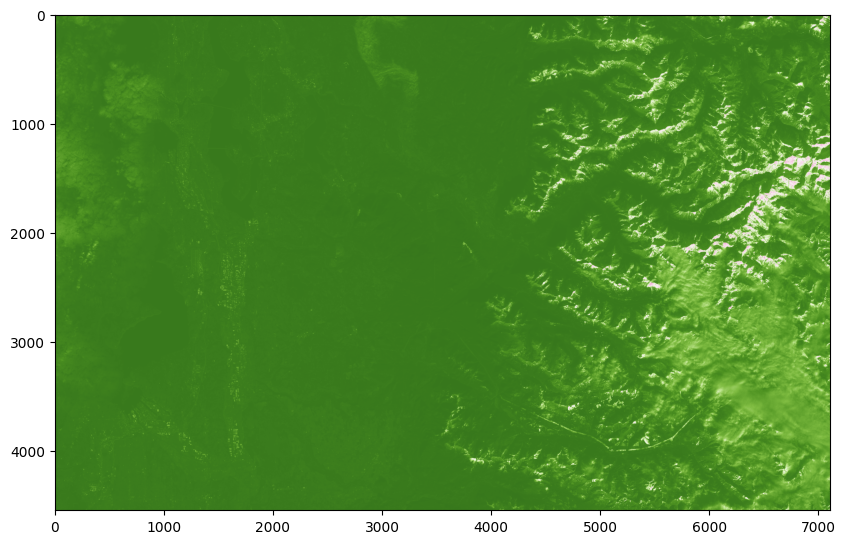

In [ ]:
plt.imshow(image_read_masked, cmap="PiYG_r")

# Part 4 - Spatial Clustering - K-Means & DBSCAN

##  Exploratory Data Analysis and K-means Clustering

### Part A - Data exploration and pre-processing

**A1. Use pandas to load the accidents dataset**

In [ ]:
crashes_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/archive/UK_Accident.csv')

**A2. Display the first few rows of data**

In [ ]:
crashes_df.head()

,Unnamed: 0,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year
0,0,200501BS00001,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,...,Zebra crossing,Daylight: Street light present,Raining without high winds,Wet/Damp,NaN,NaN,1,Yes,E01002849,2005
1,1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,...,Pedestrian phase at traffic signal junction,Darkness: Street lights present and lit,Fine without high winds,Dry,NaN,NaN,1,Yes,E01002909,2005
2,2,200501BS00003,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,...,No physical crossing within 50 meters,Darkness: Street lights present and lit,Fine without high winds,Dry,NaN,NaN,1,Yes,E01002857,2005
3,3,200501BS00004,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,...,No physical crossing within 50 meters,Daylight: Street light present,Fine without high winds,Dry,NaN,NaN,1,Yes,E01002840,2005
4,4,200501BS00005,528060.0,179040.0,-0.156618,51.495752,1,3,1,1,...,No physical crossing within 50 meters,Darkness: Street lighting unknown,Fine without high winds,Wet/Damp,NaN,NaN,1,Yes,E01002863,2005


**A3. Tidy up the data**

In [ ]:
crashes_subset = crashes_df [["Accident_Severity", "Number_of_Vehicles", "Light_Conditions", "Road_Surface_Conditions","Day_of_Week", "Year"]]
crashes_subset.head()

,Accident_Severity,Number_of_Vehicles,Light_Conditions,Road_Surface_Conditions,Day_of_Week,Year
0,2,1,Daylight: Street light present,Wet/Damp,3,2005
1,3,1,Darkness: Street lights present and lit,Dry,4,2005
2,3,2,Darkness: Street lights present and lit,Dry,5,2005
3,3,1,Daylight: Street light present,Dry,6,2005
4,3,1,Darkness: Street lighting unknown,Wet/Damp,2,2005


**A4. Subset the data for accidents which occurred in 2010**

In [ ]:
crashes_2010 = crashes_subset['Year'] == 2010
crashes_2010_df = crashes_subset[crashes_2010]
crashes_2010_df.head()

,Accident_Severity,Number_of_Vehicles,Light_Conditions,Road_Surface_Conditions,Day_of_Week,Year
733565,3,2,Daylight: Street light present,Wet/Damp,2,2010
733566,3,1,Darkness: Street lights present and lit,Wet/Damp,2,2010
733567,3,2,Daylight: Street light present,Dry,3,2010
733568,3,2,Darkness: Street lights present and lit,Dry,7,2010
733569,3,2,Darkness: Street lights present and lit,Wet/Damp,2,2010


**A5. Plot of days of the week on which crashes occurred**

**A6. Plot accident severity against road condition**

**A7. Visualise 2010 accidents**

In [1]:
geometry = gpd.points_from_xy(crashes_2010_df.Longitude, crashes_2010_df.Latitude)
crashes_2010_gdf = gpd.GeoDataFrame(crashes_2010_df,geometry=geometry,crs="EPSG:4326")
viz(crashes_2010_gdf)

NameError: name 'gpd' is not defined

**A8. Display Edinburgh-Glasgow accidents using a spatial filter**

In [ ]:
ld_bbox = [-4.537,55.787,-3.027,55.989]

crashes_2010_gdf = crashes_2010_gdf[crashes_2010_gdf.intersects(shapely.box(*ld_bbox))]

viz(crashes_2010_gdf)

Map(basemap=MaplibreBasemap(mode='interleaved', style=<CartoStyle.DarkMatter: 'https://basemaps.cartocdn.com/g…

### Part B - K-means Clustering Implementation

**B1 & 2. Implementing K-means clusters to Edi-Gla dataframe and mapping them using lonboard**

5 clusters:

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=42)
crashes_2010_gdf['kmeans_cluster'] = kmeans.fit_predict(crashes_2010_gdf[['Longitude', 'Latitude']])


import plotly.express as px

fig_kmeans = px.scatter_mapbox(
    crashes_2010_gdf,
    lat="Latitude",
    lon="Longitude",
    color="kmeans_cluster",
    mapbox_style="carto-positron",
    zoom=8,
    title="K-means Clustering",
    height=700,    # Set initial height in pixels (width is responsive)
    opacity=0.5,

)
fig_kmeans.show()

3 Clusters:

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=42)
crashes_2010_gdf['kmeans_cluster'] = kmeans.fit_predict(crashes_2010_gdf[['Longitude', 'Latitude']])


import plotly.express as px

fig_kmeans = px.scatter_mapbox(
    crashes_2010_gdf,
    lat="Latitude",
    lon="Longitude",
    color="kmeans_cluster",
    mapbox_style="carto-positron",
    zoom=8,
    title="K-means Clustering",
    height=700,    # Set initial height in pixels (width is responsive)
    opacity=0.5,

)
fig_kmeans.show()

**B3. Describe the clustering results**

Changing the values of k changes the number of clusters the program identifies. The clusters here are seperated by location (latitude and longitude), therefore the clusters appear evenly spaced across the country

**B4 & 5. Plotting clusters using other categories**

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=42)
crashes_2010_gdf['kmeans_cluster'] = kmeans.fit_predict(crashes_2010_gdf[['Accident_Severity', 'Number_of_Vehicles']])


import plotly.express as px

fig_kmeans = px.scatter_mapbox(
    crashes_2010_gdf,
    lat="Latitude",
    lon="Longitude",
    color="kmeans_cluster",
    mapbox_style="carto-positron",
    zoom=8,
    title="K-means Clustering",
    height=700,    # Set initial height in pixels (width is responsive)
    opacity=0.5,

)
fig_kmeans.show()

**B6. Explain the results**

The map now shows the accidents in the central belt clustered by severity and number of vehicles involved. It shows three distinct clusters where similar accidents have occurred. This is far more useful information as it helps to spot patterns in the data beyond simple geograpical distribution of data. However using latitude and longitude can still be useful if one was trying to investigate for example if any particular areas are more succeptable to accidents than others.

## Spatial Analysis and DBSCAN Clustering

### Part A: Spatial Correlation

**A1. New dataset for DBSCAN**

In [ ]:
geometry = gpd.points_from_xy(crashes_2010_df.Longitude, crashes_2010_df.Latitude)
crashes_2010_DB = gpd.GeoDataFrame(crashes_2010_df,geometry=geometry,crs="EPSG:4326")

**A2 & 3. Filter the dataset for Birmingham and visualise it**

In [ ]:
ld_bbox = [-2.291,52.312,-1.579,52.635]

crashes_2010_DB = crashes_2010_DB[crashes_2010_DB.intersects(shapely.box(*ld_bbox))]

viz(crashes_2010_DB)

Map(basemap=MaplibreBasemap(mode='interleaved', style=<CartoStyle.DarkMatter: 'https://basemaps.cartocdn.com/g…

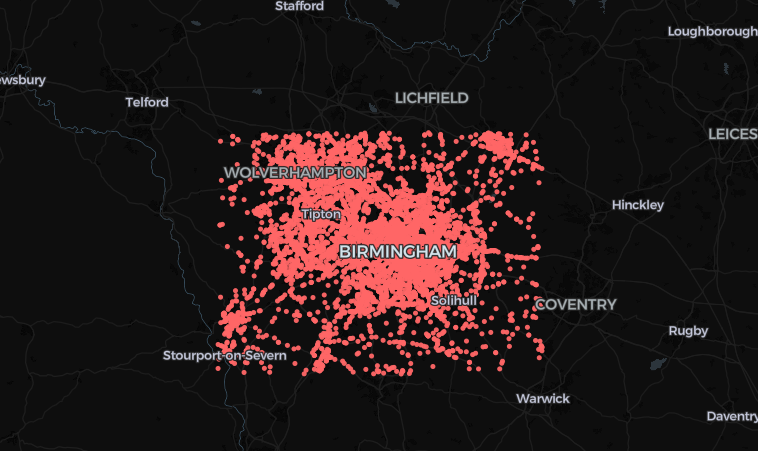

**A4. Check the data types for the dataset**

In [ ]:
crashes_2010_DB.dtypes

,0
Longitude,float64
Latitude,float64
Accident_Severity,int64
Number_of_Vehicles,int64
Light_Conditions,object
Road_Surface_Conditions,object
Day_of_Week,int64
Year,int64
geometry,geometry


**A5. Test for correlations between the numeric variables in the dataset**

In [ ]:
corr = crashes_2010_DB.corr(numeric_only=True)
print(corr)

                    Longitude  Latitude  Accident_Severity  \
Longitude            1.000000 -0.040800           0.000193   
Latitude            -0.040800  1.000000          -0.005374   
Accident_Severity    0.000193 -0.005374           1.000000   
Number_of_Vehicles   0.025870  0.019191           0.127357   
Day_of_Week          0.000813  0.015174           0.003796   
Year                      NaN       NaN                NaN   

                    Number_of_Vehicles  Day_of_Week  Year  
Longitude                     0.025870     0.000813   NaN  
Latitude                      0.019191     0.015174   NaN  
Accident_Severity             0.127357     0.003796   NaN  
Number_of_Vehicles            1.000000    -0.011428   NaN  
Day_of_Week                  -0.011428     1.000000   NaN  
Year                               NaN          NaN   NaN  


**A6. Create a correlation heatmap**

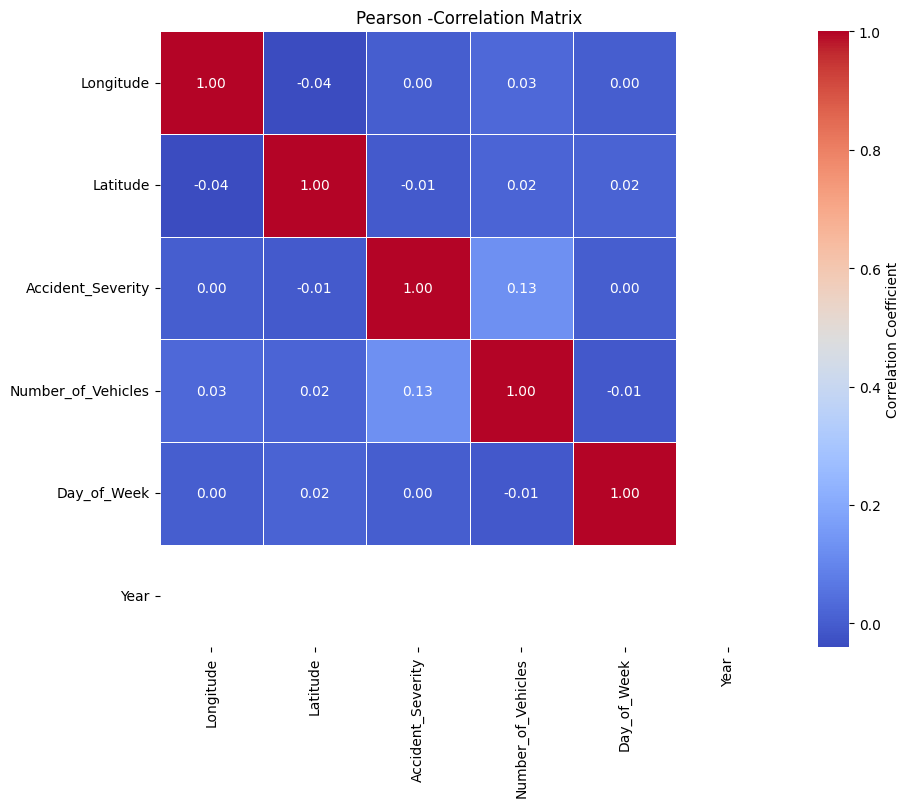

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    fmt='.2f',           # Format annotations to 2 decimal places
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)

plt.title('Pearson -Correlation Matrix')
plt.show()

**A7. Install pysal**

In [ ]:
pip install pysal

**A8. Import libraries**

In [ ]:
import libpysal.weights as weights
from esda.moran import Moran

**A9. Reproject the dataset**

In [ ]:
crashes_2010_project = crashes_2010_DB.to_crs(epsg=27700)

**A10. Testing for spatial correlation**

In [ ]:
w = weights.DistanceBand.from_dataframe(crashes_2010_project, threshold=500, ids=crashes_2010_DB.index) #Adjust this line to match your variables.
w.transform = 'R'
moran = Moran(crashes_2010_DB['Accident_Severity'], w) #Adjust this line to match your variables.

print(f"\n--- Moran's I Spatial Autocorrelation Analysis ---")
print(f"Defined {w.n} observations and {w.mean_neighbors:.2f} average neighbors per point.")
print(f"\nMoran's I Statistic (Observed I): {moran.I:.4f}")
print(f"P-value (significance): {moran.p_sim:.4f}")

/usr/local/lib/python3.12/dist-packages/libpysal/weights/util.py:826: UserWarning:

The weights matrix is not fully connected: 
 There are 587 disconnected components.
 There are 305 islands with ids: 795030, 795181, 795204, 795260, 795331, 795385, 795493, 795630, 795737, 795767, 795808, 795873, 795998, 796064, 796098, 796112, 796146, 796192, 796211, 796212, 796224, 796250, 796251, 796308, 796325, 796364, 796365, 796379, 796517, 796544, 796616, 796617, 796627, 796710, 796747, 796766, 796856, 796865, 796887, 796919, 796942, 796948, 796957, 796994, 797036, 797057, 797065, 797088, 797113, 797214, 797268, 797437, 797807, 797813, 797821, 797823, 797824, 797825, 797832, 797840, 797851, 797853, 797869, 797872, 797875, 797879, 797902, 797903, 797916, 797923, 797926, 797931, 797936, 797956, 797977, 797978, 797980, 797988, 798003, 798009, 798010, 798016, 798028, 798037, 798056, 798058, 798059, 798062, 798066, 798069, 798072, 798079, 798094, 798119, 798126, 798129, 798136, 798152, 798604, 798781,

('WARNING: ', 795030, ' is an island (no neighbors)')
('WARNING: ', 795181, ' is an island (no neighbors)')
('WARNING: ', 795204, ' is an island (no neighbors)')
('WARNING: ', 795260, ' is an island (no neighbors)')
('WARNING: ', 795331, ' is an island (no neighbors)')
('WARNING: ', 795385, ' is an island (no neighbors)')
('WARNING: ', 795493, ' is an island (no neighbors)')
('WARNING: ', 795630, ' is an island (no neighbors)')
('WARNING: ', 795737, ' is an island (no neighbors)')
('WARNING: ', 795767, ' is an island (no neighbors)')
('WARNING: ', 795808, ' is an island (no neighbors)')
('WARNING: ', 795873, ' is an island (no neighbors)')
('WARNING: ', 795998, ' is an island (no neighbors)')
('WARNING: ', 796064, ' is an island (no neighbors)')
('WARNING: ', 796098, ' is an island (no neighbors)')
('WARNING: ', 796112, ' is an island (no neighbors)')
('WARNING: ', 796146, ' is an island (no neighbors)')
('WARNING: ', 796192, ' is an island (no neighbors)')
('WARNING: ', 796211, ' is a

*Explanation:*

The I value of 0.02 is very close to 0 which means there is almost no spatial autocorrelation, the pattern is random. With a P-value of 0.013, the chances of this occurring by chance are very low (<5%).

### Part B: DBSCAN Clustering Implementation:

**B1 & 2. Implement DBSCAN to the dataset, varying the values of eps and min_samples, and map using plotly library**

In [ ]:
crashes_2010_project['geometry_x'] = crashes_2010_project.geometry.x
crashes_2010_project['geometry_y'] = crashes_2010_project.geometry.y

meters_eps = 1000
min_samples_val = 10

dbscan = DBSCAN(eps=meters_eps, min_samples=min_samples_val)

crashes_2010_project['dbscan_cluster'] = dbscan.fit_predict(
    crashes_2010_project[['geometry_x', 'geometry_y']])

fig_dbscan = px.scatter_mapbox(
    crashes_2010_project,
    lat="Latitude",
    lon="Longitude",
    color="dbscan_cluster",
    mapbox_style="carto-positron",
    zoom=9,  # Adjust zoom level as needed
    title="DBSCAN Clustering",
    height=700,    # Set initial height in pixels (width is responsive)
    opacity=0.5,

)
fig_dbscan.show()

In [ ]:
crashes_2010_project['geometry_x'] = crashes_2010_project.geometry.x
crashes_2010_project['geometry_y'] = crashes_2010_project.geometry.y

meters_eps = 200
min_samples_val = 5

dbscan = DBSCAN(eps=meters_eps, min_samples=min_samples_val)

crashes_2010_project['dbscan_cluster'] = dbscan.fit_predict(
    crashes_2010_project[['geometry_x', 'geometry_y']])

fig_dbscan = px.scatter_mapbox(
    crashes_2010_project,
    lat="Latitude",
    lon="Longitude",
    color="dbscan_cluster",
    mapbox_style="carto-positron",
    zoom=9,  # Adjust zoom level as needed
    title="DBSCAN Clustering",
    height=700,    # Set initial height in pixels (width is responsive)
    opacity=0.5,

)
fig_dbscan.show()

**B3. Describe the results and the effect of changing eps and min_samples**

The results show where there are clusters of vehicle accidents which have occurred in and around Birmingham. Changing the value of eps changes how close two points must be to be considered 'neighbours' for the purposes of clustering analysis, while changing min_samples changes how many points must be together for them to be considered 'clustered'. Personally I find the values I used for the second map more effective. The second map quite clearly shows certain areas where accidents are more concentrated, such as in the city centre and to the North West.

**B4. Describe the differences between K-Means and DBSCAN**

The main difference which makes DBSCAN more useful here (in my opinion) is that K-Means is attempting to cluster every single point into a specified number of clusters, which means it may show patterns which do not really exist for the sake of assigning a point to a cluster. DBSCAN on the other hand is able to largely ignore points which do not cluster naturally, which makes it easier to identify areas where there may be a genuine pattern, i.e. a particularly dangerour section of road in this example.

**B5. Real world implications of the clusters**

The clusters show areas where car accidents are particularly prevelant. This could mean that urban planners need to look at street/junction design, speed limits, safety features such as barriers, speed bumps, etc. in areas with clusters of accidents. As some of these accidents could potentially cause casualties/fatalities, using a data driven approach to reduce accidents could potentially prevent injury or save lives.